In [148]:
import os
import sys

"""Linux"""
os.chdir("/home/optimusprime/Desktop/peeterson/github/DeepAR_demand_prediction/Rental_Fleet_Demand_Forecast")
sys.path.append(os.path.abspath(os.path.join("/home/optimusprime/Desktop/peeterson/github/DeepAR_demand_prediction/Rental_Fleet_Demand_Forecast")))

os.chdir("/home/optimusprime/Desktop/peeterson/github/DeepAR_demand_prediction/Rental_Fleet_Demand_Forecast/libs/linux-gpu")


#from ctypes import FormatError
import numpy as np

import warnings
warnings.filterwarnings("ignore")

import os,sys

import torch
torch.use_deterministic_algorithms(True)
import pytorch_lightning as pl
from pytorch_forecasting.data.encoders import TorchNormalizer
from pytorch_forecasting.metrics import SMAPE, RMSE
from torchmetrics import R2Score, SymmetricMeanAbsolutePercentageError, MeanSquaredError

import matplotlib.pyplot as plt
import pandas as pd
from pytorch_forecasting.data import TimeSeriesDataSet
from pytorch_forecasting.data.encoders import NaNLabelEncoder
from pytorch_lightning.callbacks import EarlyStopping, LearningRateMonitor
import torch
from pytorch_forecasting.data.encoders import TorchNormalizer
import os,sys
import numpy as np
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.stattools import acf,pacf
from scipy.signal import find_peaks
import operator
import statsmodels.api as sm
from itertools import combinations
import pickle
from pytorch_forecasting import Baseline
import random
from pytorch_forecasting import DeepAR,NegativeBinomialDistributionLoss
from itertools import product
from sklearn.metrics import mean_absolute_error, mean_squared_error
import optuna
from optuna.trial import TrialState
import plotly
#from deepar_RegionWise_LinuxGpu_prediction_dev import train_and_forecast
from sklearn.metrics import classification_report

"""
Set Random seed
"""

random.seed(0)
torch.manual_seed(0)
np.random.seed(0)
## additional seeding to ensure reproduciblility.
pl.seed_everything(0)

Global seed set to 0


0

In [149]:
### Best hyperparams

neu = 110
lay = 1
bat = 544
lr = 0.009728867115126908
drop = 0.8

num_ep = 30
dataset_size = 0.9

In [150]:
"""
Import pre-processed Data (tsfresh features)

response and target are the same thing
"""

### Your code
os.chdir('/home/optimusprime/Desktop/Data_Timothy')
############ Basically df = raw_feat_df <-------------------------
df = pd.read_parquet('EXP_1_combined_dd_ss_raw_feat_data_no_tsfresh.parquet', engine='pyarrow')
df

,time_idx,datetime,group,target,inflow
0,0,2021-01-01 00:00:00,4,3.0,8.0
1,1,2021-01-01 01:00:00,4,1.0,13.0
2,2,2021-01-01 02:00:00,4,2.0,9.0
3,3,2021-01-01 03:00:00,4,3.0,5.0
4,4,2021-01-01 04:00:00,4,0.0,2.0
...,...,...,...,...,...
1637653,24808,2023-10-31 16:00:00,263,126.0,153.0
1637654,24809,2023-10-31 17:00:00,263,112.0,135.0
1637655,24810,2023-10-31 18:00:00,263,99.0,119.0
1637656,24811,2023-10-31 19:00:00,263,60.0,119.0


In [151]:
working_directory = '/home/optimusprime/Desktop/Timothy_EXP_1'
os.chdir(working_directory)

In [152]:
first_idx = df['time_idx'][0]
total_time_idx = df[df.group == 4].shape[0]
reduced_df_time_idx = [*range(int((1-dataset_size)*total_time_idx), total_time_idx+1, 1)]
df = df[df['time_idx'].isin(reduced_df_time_idx)]

In [153]:
numeric_cols = list(df.columns)
numeric_cols = [e for e in numeric_cols if e not in ('time_idx', 'datetime', 'group', 'target')]
print(numeric_cols)

['inflow']


In [154]:
#################### add date information ts ####################

# create datetime features from datetime column in raw_feat_df
df['_hour_of_day'] = df["datetime"].dt.hour.astype(str)
df['_day_of_week'] = df["datetime"].dt.dayofweek.astype(str)
df['_day_of_month'] = df["datetime"].dt.day.astype(str)
df['_day_of_year'] = df["datetime"].dt.dayofyear.astype(str)
df['_week_of_year'] = df["datetime"].dt.weekofyear.astype(str)
df['_month_of_year'] = df["datetime"].dt.month.astype(str)
df['_year'] = df["datetime"].dt.year.astype(str)
#################### add date information ts ####################

hour_of_day_nunique = df['_hour_of_day'].nunique()
day_of_week_nunique = df['_day_of_week'].nunique()
day_of_month_nunique = df['_day_of_month'].nunique()
day_of_year_nunique = df['_day_of_year'].nunique()
week_of_year_nunique = df['_week_of_year'].nunique()
month_of_year_nunique = df['_month_of_year'].nunique()
year_nunique = df['_year'].nunique()

In [155]:
df

,time_idx,datetime,group,target,inflow,_hour_of_day,_day_of_week,_day_of_month,_day_of_year,_week_of_year,_month_of_year,_year
2481,2481,2021-04-14 09:00:00,4,6.0,12.0,9,2,14,104,15,4,2021
2482,2482,2021-04-14 10:00:00,4,6.0,11.0,10,2,14,104,15,4,2021
2483,2483,2021-04-14 11:00:00,4,2.0,18.0,11,2,14,104,15,4,2021
2484,2484,2021-04-14 12:00:00,4,2.0,23.0,12,2,14,104,15,4,2021
2485,2485,2021-04-14 13:00:00,4,7.0,25.0,13,2,14,104,15,4,2021
...,...,...,...,...,...,...,...,...,...,...,...,...
1637653,24808,2023-10-31 16:00:00,263,126.0,153.0,16,1,31,304,44,10,2023
1637654,24809,2023-10-31 17:00:00,263,112.0,135.0,17,1,31,304,44,10,2023
1637655,24810,2023-10-31 18:00:00,263,99.0,119.0,18,1,31,304,44,10,2023
1637656,24811,2023-10-31 19:00:00,263,60.0,119.0,19,1,31,304,44,10,2023


In [156]:
print(hour_of_day_nunique)
print(day_of_week_nunique)
print(day_of_month_nunique)
print(day_of_year_nunique)
print(week_of_year_nunique)
print(month_of_year_nunique)
print(year_nunique)

24
7
31
365
52
12
3


In [157]:
unique_values_group_no_ts_fresh = list(df['group'].unique())
print(len(unique_values_group_no_ts_fresh), "\n")
print(unique_values_group_no_ts_fresh)

66 

[4, 12, 13, 24, 41, 42, 43, 45, 48, 50, 68, 74, 75, 79, 87, 88, 90, 100, 107, 113, 114, 116, 120, 125, 127, 128, 137, 140, 141, 142, 143, 144, 148, 151, 152, 153, 158, 161, 162, 163, 164, 166, 170, 186, 194, 202, 209, 211, 224, 229, 230, 231, 232, 233, 234, 236, 237, 238, 239, 243, 244, 246, 249, 261, 262, 263]


In [158]:
zones_time_idx_no_ts_fresh = {}
for i in unique_values_group_no_ts_fresh:
    df1 = df[df['group'] == i]
    time_idx_list = df1['time_idx'].tolist()
    first_idx = time_idx_list[0]
    last_idx = time_idx_list[-1]
    zones_time_idx_no_ts_fresh[i] = [first_idx, last_idx]
    print("Group ", i, " has ", df1.shape[0], " number of rows in df_ts_fresh \n")
    print("First idx: ", first_idx, "; Last idx: ", last_idx, "\n")

Group  4  has  22332  number of rows in df_ts_fresh 

First idx:  2481 ; Last idx:  24812 

Group  12  has  22332  number of rows in df_ts_fresh 

First idx:  2481 ; Last idx:  24812 

Group  13  has  22332  number of rows in df_ts_fresh 

First idx:  2481 ; Last idx:  24812 

Group  24  has  22332  number of rows in df_ts_fresh 

First idx:  2481 ; Last idx:  24812 

Group  41  has  22332  number of rows in df_ts_fresh 

First idx:  2481 ; Last idx:  24812 

Group  42  has  22332  number of rows in df_ts_fresh 

First idx:  2481 ; Last idx:  24812 

Group  43  has  22332  number of rows in df_ts_fresh 

First idx:  2481 ; Last idx:  24812 

Group  45  has  22332  number of rows in df_ts_fresh 

First idx:  2481 ; Last idx:  24812 

Group  48  has  22332  number of rows in df_ts_fresh 

First idx:  2481 ; Last idx:  24812 

Group  50  has  22332  number of rows in df_ts_fresh 

First idx:  2481 ; Last idx:  24812 

Group  68  has  22332  number of rows in df_ts_fresh 

First idx:  2481

In [159]:
encoder_len = 8 # looks back 8 hours in the past for prediction
pred_len = 1 # 1, 6, 12 # how many timeseteps you want to predict in the future (forecasting), 1 means present (nowcasting)
#cov_lag_len= pred_len

# not using covariates yet, so put as 0
cov_lag_len= 0 #we can use forecasted values, even for inflow

####### train val test split of tsfresh dataframe #########

### you want a the idx for each train, validation and test

### train = 0.7 of each zone (eg. time idx 167 to roughly 20000) eg train = 0.7 * (24812-167)
### validation = 0.2 of each zone (eg. time idx 20000 to 22000)
### test = 0.1 of each zone (eg. time idx 22000 to 24000)

Target = 'target'

total_time_idx = df[df.group == 4].shape[0]

first_idx = df.loc[df['group'] == 4, 'time_idx'].iloc[0]

tr_stop_idx = int(0.7*total_time_idx)
val_start_idx = tr_stop_idx - encoder_len
# val_stop_idx = total_time_idx-1
val_stop_idx = val_start_idx + int(0.2*total_time_idx) # use (tr_stop_idx - encoder_len) as encoder from train set for validatoin
tes_start_idx = val_stop_idx - encoder_len
tes_stop_idx = total_time_idx-1
# tes_start_idx = tr_stop_idx - encoder_len
# tes_stop_idx = total_time_idx-1

print(tr_stop_idx)
print(val_start_idx)
print(val_stop_idx)
print(tes_start_idx)
print(tes_stop_idx)

15632
15624
20090
20082
22331


In [160]:
train_time_idx = [*range(first_idx, first_idx+tr_stop_idx+1, 1)]
print(train_time_idx[0], train_time_idx[-1])
val_time_idx = [*range(first_idx+val_start_idx, first_idx+val_stop_idx+1, 1)]
print(val_time_idx[0], val_time_idx[-1])
test_time_idx = [*range(first_idx+tes_start_idx, first_idx+tes_stop_idx+1, 1)]
print(test_time_idx[0], test_time_idx[-1])

2481 18113
18105 22571
22563 24812


In [161]:
"""
set inputs here
(hyperparameters grid search)

"""
######### Network Architecture ###################
# p = 10 # patience no. of epochs

Loss=NegativeBinomialDistributionLoss() # because we assume that the demand follows a negative bionmial distribution

######### Network Architecture ###################


######### Training Routine ###################
fdv_steps = 10 # fast_dev_run -> small set of training to see if training is happening correctly (one of the params in deepar model)
######### Training Routine ###################


# this is for naive forecast, getting past week's demand and predicting purely based on that
############## Inputs for 2) Persistance model ( seasonal naive forecast ) #######################
season_len = 168 # length of season ()
num_past_seas = 6 # number of past seasons to use in averaging (look at 6 week's back, getting average of these 6 values)
#seas_pred_strt_idx = 2035 # seasonal naive forecast start index, in hours use the df dataframe
############## Inputs for 2) Persistance model ( seasonal naive forecast ) #######################


In [162]:
lr_logger = LearningRateMonitor()

cat_dict = {"_hour_of_day": NaNLabelEncoder(add_nan=True).fit(df._hour_of_day),
          "_day_of_week": NaNLabelEncoder(add_nan=True).fit(df._day_of_week), "_day_of_month" : NaNLabelEncoder(add_nan=True).fit(df._day_of_month), "_day_of_year" : NaNLabelEncoder(add_nan=True).fit(df._day_of_year),
              "_week_of_year": NaNLabelEncoder(add_nan=True).fit(df._week_of_year), "_month_of_year": NaNLabelEncoder(add_nan=True).fit(df._month_of_year) ,"_year": NaNLabelEncoder(add_nan=True).fit(df._year)}
cat_list = ["_hour_of_day","_day_of_week","_day_of_month","_day_of_year","_week_of_year","_month_of_year","_year"]
embed_size_dict = {'_hour_of_day':(hour_of_day_nunique+1,5),'_day_of_week':(day_of_week_nunique+1,5),'_day_of_month':(day_of_month_nunique+1,5), '_day_of_year':(day_of_year_nunique+1,8), '_week_of_year':(week_of_year_nunique+1,3), '_month_of_year':(month_of_year_nunique+1,3),'_year':(year_nunique+1,1)}

train_dataset = TimeSeriesDataSet(
  df[(df['time_idx'].isin(train_time_idx))],
  time_idx="time_idx",
  target=Target,
  categorical_encoders=cat_dict,
  group_ids=["group"],
  min_encoder_length=encoder_len,
  max_encoder_length=encoder_len,
  min_prediction_length=pred_len,
  max_prediction_length=pred_len,
  time_varying_unknown_reals=[Target],
  time_varying_known_reals=numeric_cols,
  time_varying_known_categoricals=cat_list,
  add_relative_time_idx=False,
  randomize_length=False,
  scalers={},
  target_normalizer=TorchNormalizer(method="identity",center=False,transformation=None)
)

val_dataset = TimeSeriesDataSet.from_dataset(train_dataset,df[(df['time_idx'].isin(val_time_idx))], stop_randomization=True, predict=False)
# test_dataset = TimeSeriesDataSet.from_dataset(train_dataset,df[df['time_idx'].isin(test_time_idx)], stop_randomization=True)

train_dataloader = train_dataset.to_dataloader(train=True, batch_size=bat)
val_dataloader = val_dataset.to_dataloader(train=False, batch_size=bat)
# test_dataloader = test_dataset.to_dataloader(train=False, batch_size=bat)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Missing logger folder: /home/optimusprime/Desktop/Timothy_EXP_1/lightning_logs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                             | Params
----------------------------------------------------------------------------
0 | loss                   | NegativeBinomialDistributionLoss | 0     
1 | logging_metrics        | ModuleList                       | 0     
2 | embeddings             | MultiEmbedding                   | 3.5 K 
3 | rnn                    | LSTM                             | 63.4 K
4 | distribution_projector | Linear                           | 222   
---------------------------------------

Epoch 0: 100%|██████████| 2436/2436 [02:49<00:00, 14.39it/s, loss=3.4, v_num=0, train_loss_step=3.380, val_loss=3.440, train_loss_epoch=5.060]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 2436/2436 [02:49<00:00, 14.39it/s, loss=3.4, v_num=0, train_loss_step=3.380, val_loss=3.440, train_loss_epoch=5.060]


Predict: 100%|██████████| 5/5 [00:00<00:00,  8.01 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


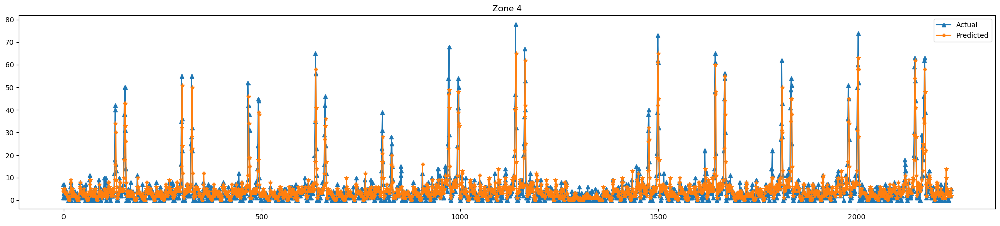

Average RMSE for 2239 days:  2.6297454220634213
full average RMSE =  4.6654010491629805
Average WMAPE for 2239 days:  35.08371583774025
full average WMAPE =  35.08371583774025 



Predict: 100%|██████████| 5/5 [00:00<00:00, 10.68 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


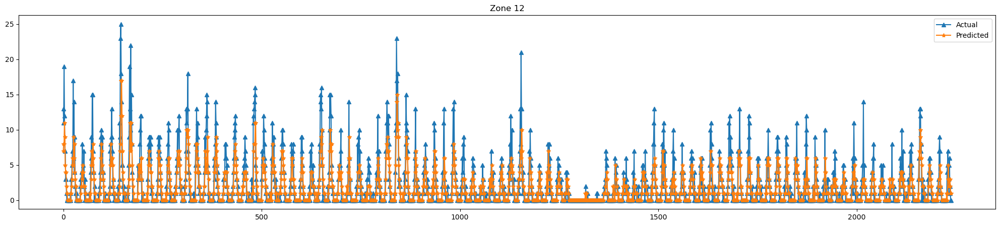

Average RMSE for 2239 days:  1.225547119249665
full average RMSE =  2.2341696598022063
Average WMAPE for 2239 days:  28.82128435224293
full average WMAPE =  28.821284352242937 



Predict: 100%|██████████| 5/5 [00:00<00:00, 10.27 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


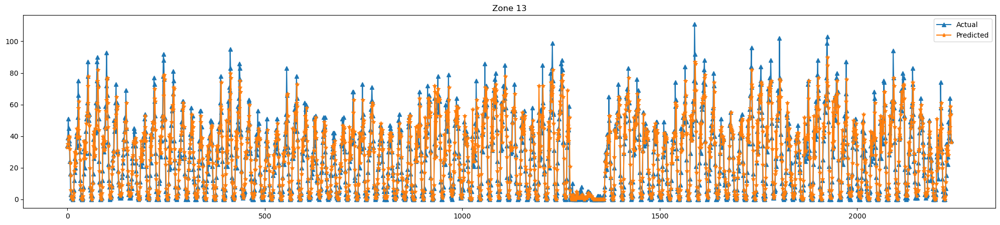

Average RMSE for 2239 days:  6.336757481018312
full average RMSE =  9.147396069150682
Average WMAPE for 2239 days:  23.852670544068335
full average WMAPE =  23.85267054406833 



Predict: 100%|██████████| 5/5 [00:00<00:00, 10.83 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


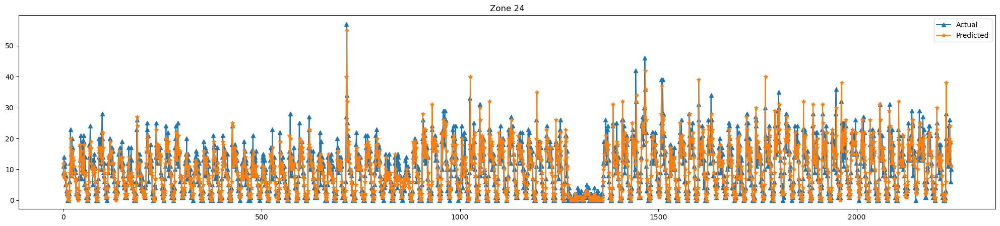

Average RMSE for 2239 days:  3.3640017865118357
full average RMSE =  4.820215729449033
Average WMAPE for 2239 days:  25.380102183366713
full average WMAPE =  25.380102183366716 



Predict: 100%|██████████| 5/5 [00:00<00:00, 10.98 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


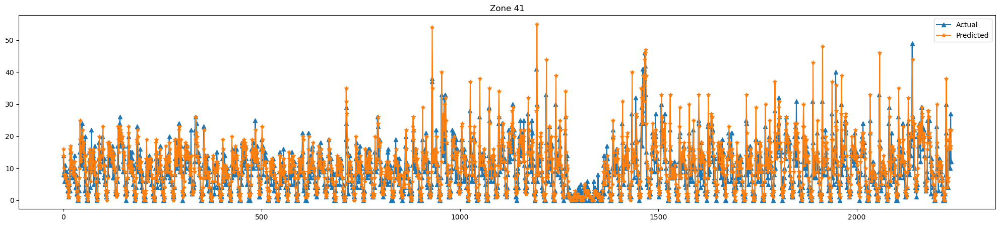

Average RMSE for 2239 days:  3.576150066994194
full average RMSE =  5.177898197668824
Average WMAPE for 2239 days:  24.911072582844998
full average WMAPE =  24.911072582845005 



Predict: 100%|██████████| 5/5 [00:00<00:00, 10.13 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


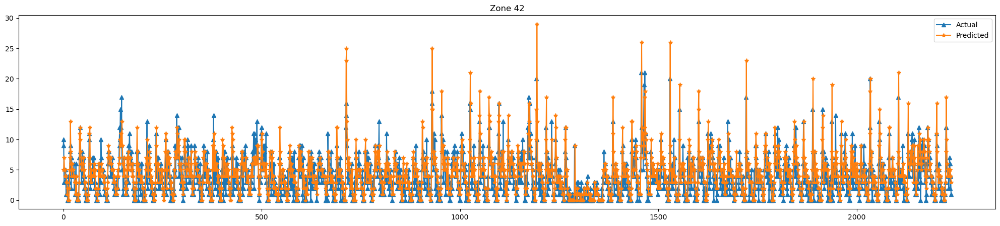

Average RMSE for 2239 days:  2.029477445288075
full average RMSE =  2.8604587406979625
Average WMAPE for 2239 days:  32.736060668136965
full average WMAPE =  32.73606066813696 



Predict: 100%|██████████| 5/5 [00:00<00:00, 10.10 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


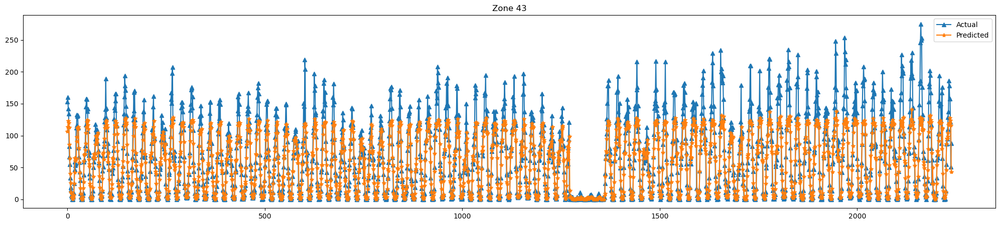

Average RMSE for 2239 days:  16.752121482804824
full average RMSE =  26.741997588355886
Average WMAPE for 2239 days:  22.078482617563193
full average WMAPE =  22.078482617563196 



Predict: 100%|██████████| 5/5 [00:00<00:00,  9.82 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


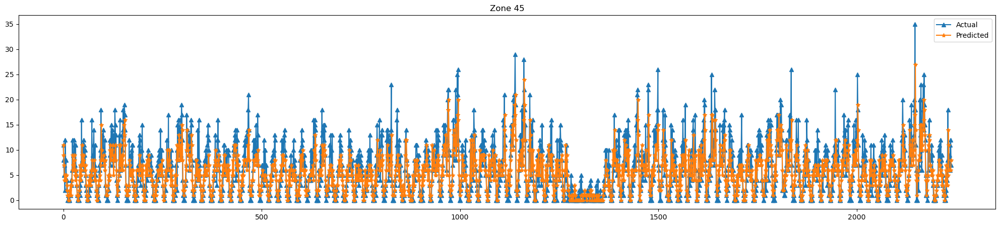

Average RMSE for 2239 days:  2.6936132201875838
full average RMSE =  3.7374174793455137
Average WMAPE for 2239 days:  30.796396135510705
full average WMAPE =  30.796396135510705 



Predict: 100%|██████████| 5/5 [00:00<00:00, 10.47 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


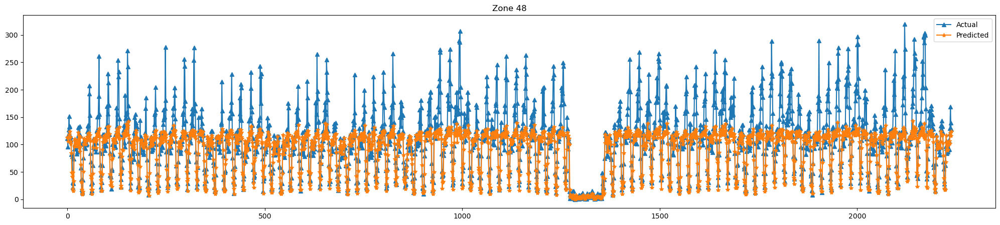

Average RMSE for 2239 days:  25.11924966502903
full average RMSE =  40.02486944619437
Average WMAPE for 2239 days:  13.212314901621307
full average WMAPE =  13.212314901621305 



Predict: 100%|██████████| 5/5 [00:00<00:00,  5.78 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


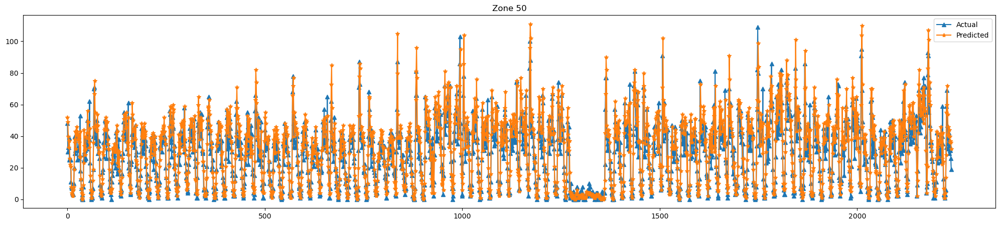

Average RMSE for 2239 days:  7.999106744082179
full average RMSE =  11.411269043714215
Average WMAPE for 2239 days:  18.559133831736855
full average WMAPE =  18.559133831736855 



Predict: 100%|██████████| 5/5 [00:00<00:00, 10.09 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


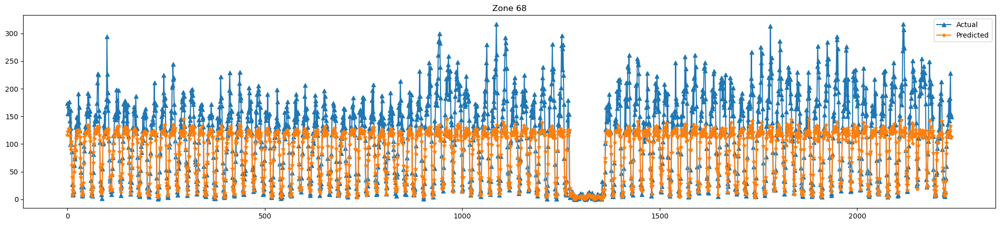

Average RMSE for 2239 days:  33.455113890129525
full average RMSE =  48.43775560378611
Average WMAPE for 2239 days:  16.38578743811436
full average WMAPE =  16.385787438114356 



Predict: 100%|██████████| 5/5 [00:00<00:00,  9.87 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


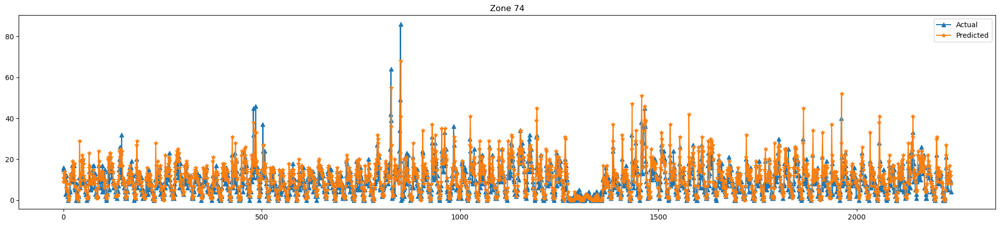

Average RMSE for 2239 days:  3.841447074586869
full average RMSE =  5.735770399979962
Average WMAPE for 2239 days:  24.68529184239817
full average WMAPE =  24.68529184239817 



Predict: 100%|██████████| 5/5 [00:00<00:00,  9.97 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


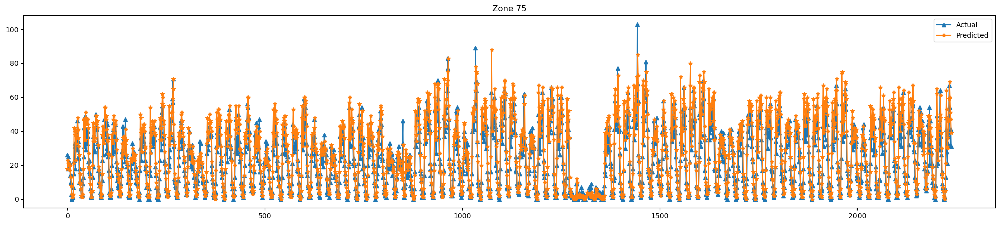

Average RMSE for 2239 days:  6.76507369361322
full average RMSE =  9.595410731249839
Average WMAPE for 2239 days:  18.768139511025517
full average WMAPE =  18.76813951102552 



Predict: 100%|██████████| 5/5 [00:00<00:00, 10.17 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


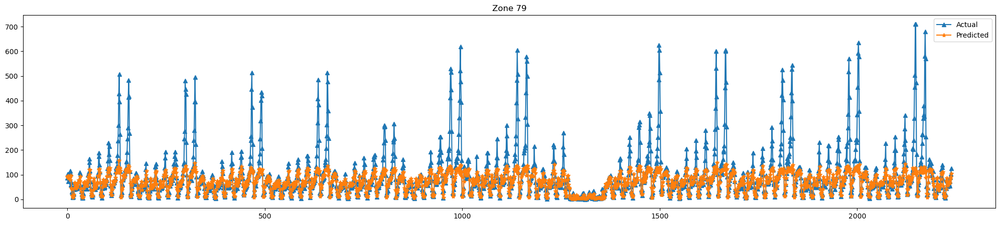

Average RMSE for 2239 days:  33.22376060741402
full average RMSE =  80.8088907237869
Average WMAPE for 2239 days:  15.325721276111999
full average WMAPE =  15.325721276112002 



Predict: 100%|██████████| 5/5 [00:00<00:00,  9.83 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


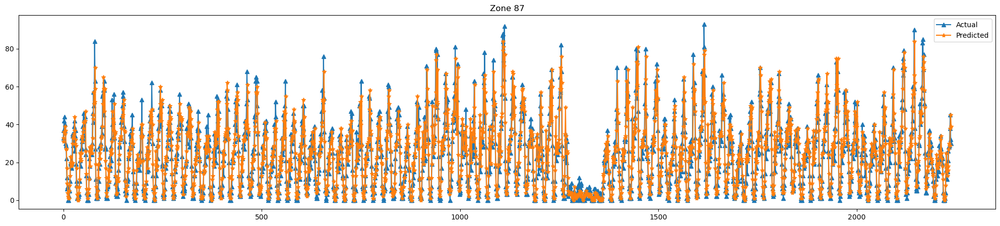

Average RMSE for 2239 days:  6.028137561411344
full average RMSE =  8.500873506859973
Average WMAPE for 2239 days:  19.95146896160638
full average WMAPE =  19.951468961606384 



Predict: 100%|██████████| 5/5 [00:00<00:00,  9.95 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


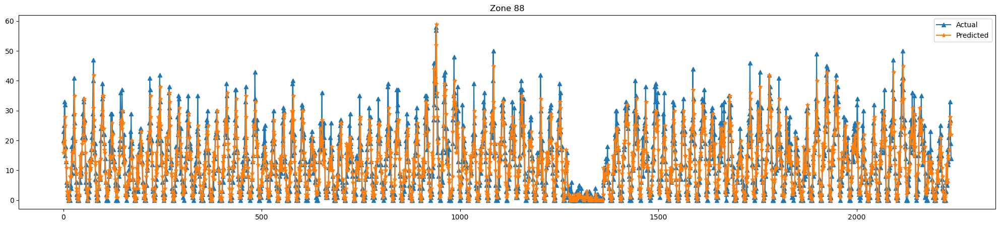

Average RMSE for 2239 days:  4.177757927646271
full average RMSE =  5.872852586169981
Average WMAPE for 2239 days:  26.415611122616696
full average WMAPE =  26.415611122616696 



Predict: 100%|██████████| 5/5 [00:00<00:00,  9.80 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


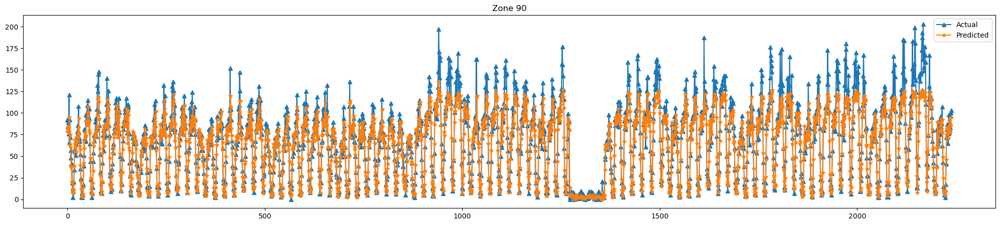

Average RMSE for 2239 days:  11.015185350602948
full average RMSE =  15.803858620536342
Average WMAPE for 2239 days:  11.186374321595158
full average WMAPE =  11.186374321595158 



Predict: 100%|██████████| 5/5 [00:00<00:00,  7.90 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


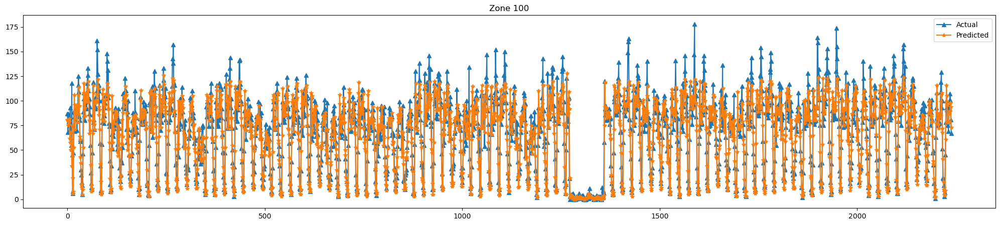

Average RMSE for 2239 days:  12.68602054488611
full average RMSE =  17.472188070258493
Average WMAPE for 2239 days:  13.234984857520221
full average WMAPE =  13.234984857520221 



Predict: 100%|██████████| 5/5 [00:00<00:00, 10.33 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


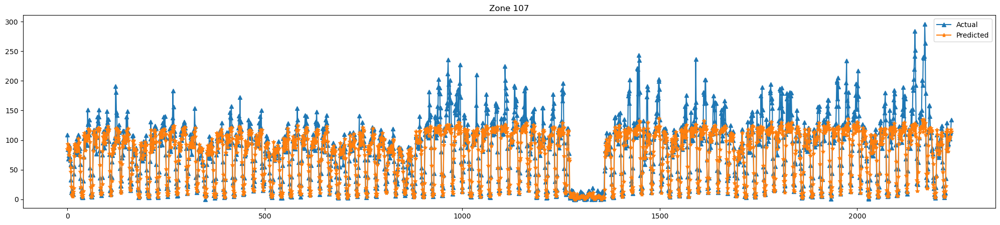

Average RMSE for 2239 days:  14.795891022778026
full average RMSE =  23.526101361850735
Average WMAPE for 2239 days:  11.106816145391438
full average WMAPE =  11.106816145391441 



Predict: 100%|██████████| 5/5 [00:00<00:00, 10.52 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


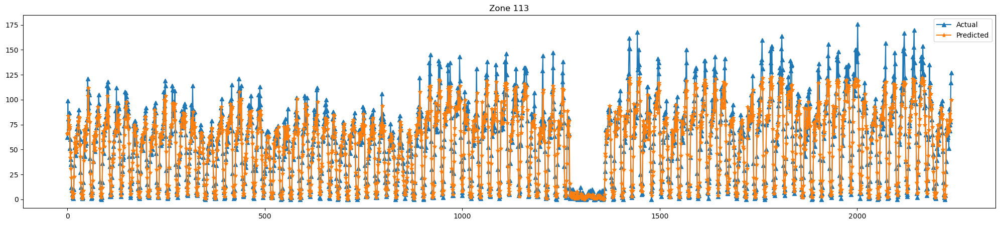

Average RMSE for 2239 days:  9.545332737829389
full average RMSE =  13.534169286513897
Average WMAPE for 2239 days:  13.932750981001425
full average WMAPE =  13.932750981001425 



Predict: 100%|██████████| 5/5 [00:00<00:00, 10.29 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


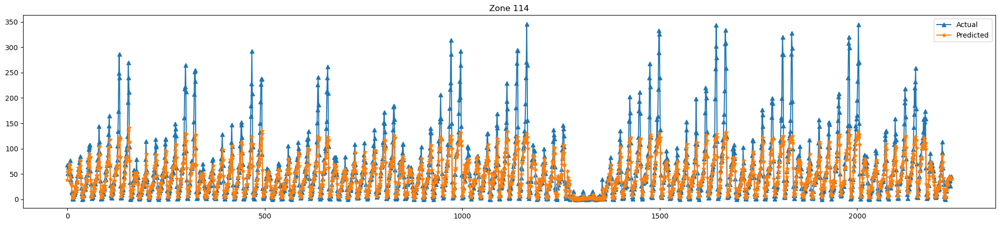

Average RMSE for 2239 days:  16.640911121036176
full average RMSE =  33.64942211619552
Average WMAPE for 2239 days:  18.23590668327638
full average WMAPE =  18.235906683276376 



Predict: 100%|██████████| 5/5 [00:00<00:00, 10.41 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


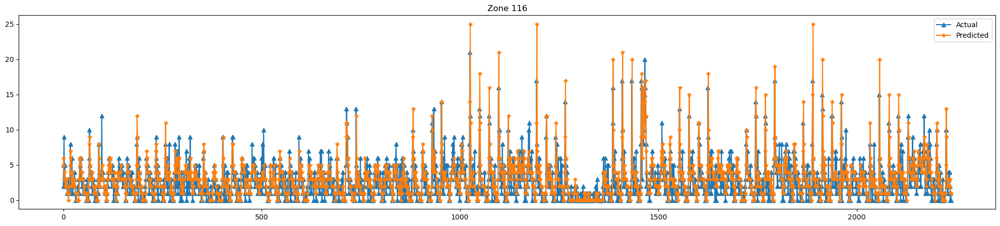

Average RMSE for 2239 days:  1.6516301920500223
full average RMSE =  2.480653143400971
Average WMAPE for 2239 days:  35.39402277206131
full average WMAPE =  35.39402277206131 



Predict: 100%|██████████| 5/5 [00:00<00:00,  9.54 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


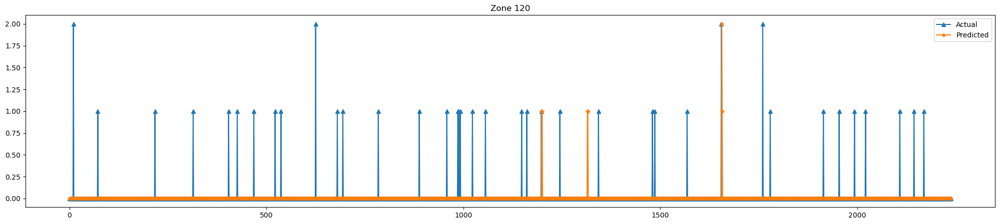

Average RMSE for 2239 days:  0.02188476998660116
full average RMSE =  0.16233006368415998
Average WMAPE for 2239 days:  1.965163000669942
full average WMAPE =  1.9651630006699425 



Predict: 100%|██████████| 5/5 [00:00<00:00, 10.49 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


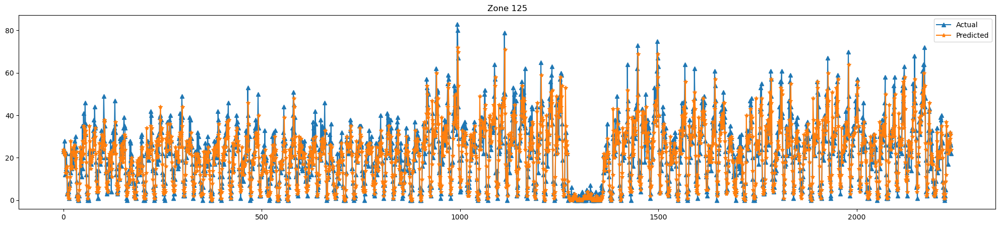

Average RMSE for 2239 days:  5.732023224653863
full average RMSE =  7.840128791861713
Average WMAPE for 2239 days:  20.107961499735957
full average WMAPE =  20.10796149973596 



Predict: 100%|██████████| 5/5 [00:00<00:00,  9.99 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


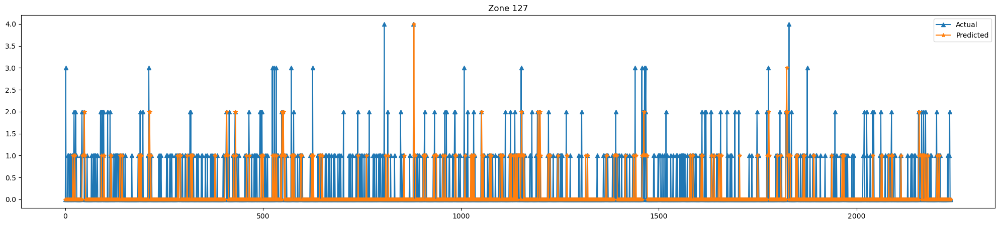

Average RMSE for 2239 days:  0.33050468959356855
full average RMSE =  0.6709701800985716
Average WMAPE for 2239 days:  27.241327725667215
full average WMAPE =  27.241327725667215 



Predict: 100%|██████████| 5/5 [00:00<00:00,  8.03 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


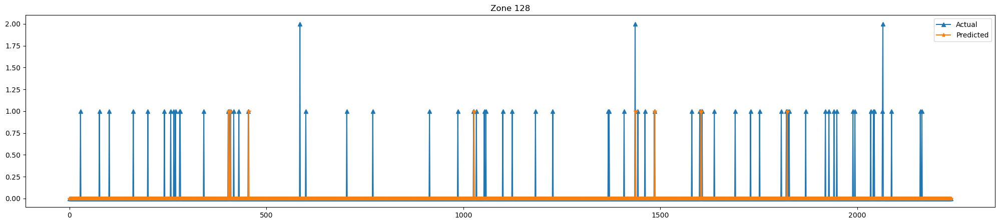

Average RMSE for 2239 days:  0.034836980794997766
full average RMSE =  0.193692407049061
Average WMAPE for 2239 days:  3.3497096589995534
full average WMAPE =  3.3497096589995543 



Predict: 100%|██████████| 5/5 [00:00<00:00, 10.70 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


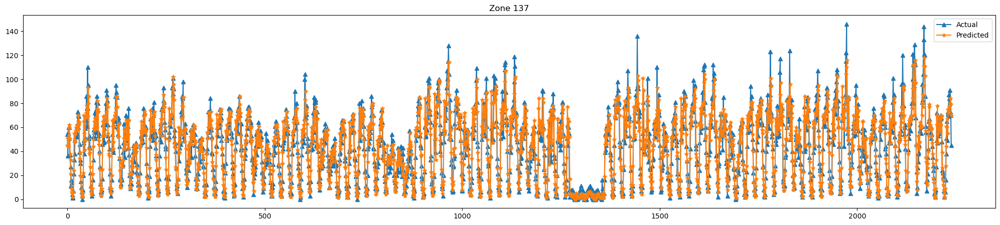

Average RMSE for 2239 days:  8.192050022331397
full average RMSE =  11.271310023954468
Average WMAPE for 2239 days:  13.365550797020157
full average WMAPE =  13.365550797020159 



Predict: 100%|██████████| 5/5 [00:00<00:00, 10.53 batches/s]


pred_start_idx =  2021-04-24 08:00:00 22571


KeyboardInterrupt: 

In [163]:
"""
Machine Learning predictions START
1) DeepAR

"""
trainer = pl.Trainer(
    max_epochs=num_ep,
    accelerator='gpu',
    devices=[0],
    auto_lr_find=False,
    gradient_clip_val=0.1,
    limit_train_batches=1.0,
    limit_val_batches=1.0,
    #fast_dev_run=fdv_steps,
    logger=True,
    #log_every_n_steps=10,
    # profiler=True,
    callbacks=[lr_logger]#, early_stop_callback],
    #enable_checkpointing=True,
    #default_root_dir="C:\Work\WORK_PACKAGE\Demand_forecasting\github\DeepAR-pytorch\My_model\2_freq_nbinom_LSTM\1_cluster_demand_prediction\logs"
)

#print(f"training routing:\n \n {trainer}")
deepar =DeepAR.from_dataset(
    train_dataset,
    learning_rate=lr,
    hidden_size=neu,
    rnn_layers=lay,
    dropout=drop,
    loss=Loss,
    log_interval=20,
    log_val_interval=6,
    log_gradient_flow=False,
    embedding_sizes=embed_size_dict
    # reduce_on_plateau_patience=3,
)

#print(f"Number of parameters in network: {deepar.size()/1e3:.1f}k")
# print(f"Model :\n \n {deepar}")
torch.set_num_threads(10)
trainer.fit(
    deepar,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
)

########## Prediction #####################

for group in unique_values_group_no_ts_fresh:
  test_dataset = TimeSeriesDataSet.from_dataset(train_dataset,df[df['time_idx'].isin(test_time_idx) & (df['group'] == group)], stop_randomization=True)
  test_dataloader = test_dataset.to_dataloader(train=False, batch_size=bat)


  test_output = deepar.predict(data=test_dataloader,mode='prediction',return_index=True,num_workers=8,show_progress_bar=True)

  pred_start_idx = int(test_output[1]['time_idx'][0])

  actual1_full = np.array([])
  pred_full = np.array([])  
  RMSE_list = np.array([])
  WMAPE_list = np.array([])
  days = tes_stop_idx - val_stop_idx - pred_len - pred_len

  for j in range(0,days,pred_len):

    if j == 0:
      print('pred_start_idx = ',df["datetime"].iloc[pred_start_idx],pred_start_idx )
    
    actual_df = df[df['group'] == group]

    prediction_index = [*range(pred_start_idx+(j), pred_start_idx+(j)+pred_len, 1)]

    actual = actual_df[actual_df['time_idx'].isin(prediction_index)]['target'].values

    actual1_full = np.append(actual1_full, actual)
    #plt.plot(actual,'*-')
    pred = np.array(np.rint(test_output[0][j])).astype(int)

    pred_full = np.append(pred_full, pred)
    #plt.plot(pred,'^-')
    #plt.show()

    absolute_error = np.abs(actual - pred)
    absolute_sum = np.abs(actual) + np.abs(pred)
    WMAPE = np.mean(absolute_error / (absolute_sum + 1e-8)) * 100
    
    # WMAPE = np.mean(np.abs(actual-pred)/np.abs(actual)+ 1e-8) * 100
    RMSE = np.sqrt(mean_squared_error(actual,pred ))
    #print('RMSE : ',RMSE)
    RMSE_list = np.append(RMSE_list,RMSE) 
    WMAPE_list = np.append(WMAPE_list,WMAPE)

  plt.figure(figsize=(25,5))
  plt.plot(actual1_full.flatten(),'^-', label='Actual')
  plt.plot(pred_full.flatten(),'*-', label='Predicted')
  plt.title('Zone ' + str(group))  # Replace 'XYZ' with your actual group number
  plt.legend()
  plt.show()

  print(f'Average RMSE for {days} days: ',np.mean(RMSE_list))
  print('full average RMSE = ',np.sqrt(mean_squared_error(actual1_full.flatten(),pred_full.flatten() )))
  print(f'Average WMAPE for {days} days: ',np.mean(WMAPE_list))
  wmape_full = np.mean(np.abs(actual1_full.flatten() - pred_full.flatten()) / (np.abs(actual1_full.flatten()) + np.abs(pred_full.flatten()) + 1e-8)) * 100
  print('full average WMAPE = ', wmape_full, '\n')

########## Prediction #####################



"""
Machine Learning predictions END
"""

In [ ]:
# """
# Baseline predictions START
# 1) Persistance model (last value)

# 2) Persistance model ( seasonal naive forecast )
# """
# ############## 1) Persistance model (last value) #######################
# # actuals = torch.cat([y[0] for x, y in iter(test_dataloader)])
# # baseline_predictions = Baseline().predict(test_dataloader)
# # print(f" Persistance model (last value), sMAPE : {SMAPE()(baseline_predictions, actuals)}")
# # print(f" Persistance model (last value), RMSE : {RMSE()(baseline_predictions,actuals)}")
# # r2score = R2Score()
# # print(f" Persistance model (last value), R2 Score : { np.mean([ r2score(baseline_predictions[i], actuals[i])    for i in range(len(actuals)) ]) }" )
# ############## 1) Persistance model (last value) #######################

# ############## 2) Persistance model ( seasonal naive forecast ) #######################
# # days=5
# # pred_start_idx=2020
# predictions_list = np.array([])
# actuals1_list = np.array([])

# RMSE_list = np.array([])

# for group in unique_values_group_no_ts_fresh:
#   test_dataset = TimeSeriesDataSet.from_dataset(train_dataset,df[df['time_idx'].isin(test_time_idx) & (df['group'] == group)], stop_randomization=True)
#   test_dataloader = test_dataset.to_dataloader(train=False, batch_size=bat)

# for j in range(0,days,pred_len):
#   predictions = np.array([])
#   strt_idx = pred_start_idx+(j)
#   actuals1 = df[Target].iloc[strt_idx:strt_idx+pred_len].values
#   for h in range(pred_len):
#       sum1 = 0
#       for n in range(num_past_seas):
#         o=4 if n%2==0 else 1
#         sum1 = sum1 + df[Target][strt_idx-o+h - season_len*n]
      
#       predictions = np.append(predictions,sum1/num_past_seas)

#   predictions = np.rint(predictions).astype(int)
#   predictions_list=np.append(predictions_list,predictions)
#   actuals1 = np.array(actuals1)
#   actuals1_list=np.append(actuals1_list,actuals1)
#   #print(actuals1_list)

#   smape = SymmetricMeanAbsolutePercentageError()
#   mse = MeanSquaredError()
#   #print(f"\nseasonal prediction start index:  {strt_idx}")
#   #print(f" Persistance model ( seasonal naive forecast ) , RMSE : {np.sqrt(mse(torch.Tensor(predictions),torch.Tensor(actuals1)))}")
#   RMSE = np.sqrt(mse(torch.Tensor(predictions),torch.Tensor(actuals1)))
#   RMSE_list = np.append(RMSE_list,RMSE)
#   # plt.title("(average) seasonal naive forecast")
#   # plt.plot(predictions,color='r')
#   # plt.plot(actuals1,color='b')
#   # plt.show()
#   absolute_error = np.abs(actuals1 - predictions)
#   absolute_sum = np.abs(actuals1) + np.abs(predictions)
#   WMAPE = np.mean(absolute_error / (absolute_sum + 1e-8)) * 100

#   #print('RMSE : ',RMSE)
#   print('WMAPE : ',WMAPE)
#   WMAPE_list = np.append(WMAPE_list,WMAPE)


# plt.figure(figsize=(25,5))
# plt.title("(average) seasonal naive forecast")
# print('pred_start_idx',pred_start_idx)
# plt.plot(actuals1_list.flatten(),'^-')
# plt.plot(predictions_list.flatten(),'*-')
# plt.show()


# print(f'Average RMSE for {days} days: ',np.mean(RMSE_list))
# print('full average RMSE = ',np.sqrt(mean_squared_error(actuals1_list.flatten(),predictions_list.flatten() )))
# print(f'Average WMAPE for {days} days: ',np.mean(WMAPE_list))
# wmape_full = np.mean(np.abs(actuals1_list.flatten() - predictions_list.flatten()) / (np.abs(actuals1_list.flatten()) + np.abs(predictions_list.flatten()) + 1e-8)) * 100
# print('full average WMAPE = ', wmape_full)
# ############## 2) Persistance model ( seasonal naive forecast ) #######################
# """
# Baseline predictions END
# """    
